In [1]:
#@title Define if we are on Colab and mount drive { display-mode: "form" }
run_params = {}
try:
  from google.colab import drive
  drive.mount('/content/gdrive')
  run_params['IN_COLAB'] = True
except:
  run_params['IN_COLAB'] = False

In [2]:
#@title (COLAB ONLY) Clone GitHub repo { display-mode: "form" }

if run_params['IN_COLAB']:
  !git clone https://github.com/lluissalord/radiology_ai.git

  %cd radiology_ai

In [3]:
#@title Setup environment and Colab general variables { display-mode: "form" }
# %%capture
%run colab_conda_setup.ipynb

In [4]:
#@title Move images from Drive to temporary folder here to be able to train models { display-mode: "form" }
# %%capture
%run move_raw_preprocess.ipynb

In [5]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split

import os
import gc

import matplotlib.pyplot as plt

from fastai.basics import *
from fastai.callback import *
from fastai.data.block import *
from fastai.data.transforms import *
from fastai.medical.imaging import *
from fastai.vision.data import *
from fastai.vision.augment import *
from fastai.vision.all import *
from fastai.vision.widgets import *

In [6]:
from preprocessing.transforms import *
# from preprocessing.dicom import *
from preprocessing.misc import *

from organize.relation import open_name_relation_file

from utils.models import *
from utils.organize import *
from utils.misc import *
from utils.data import *

In [7]:
run_params['TEST_SIZE'] = 0.15
run_params['VALID_SIZE'] = 0.15

In [8]:
# Hyperparameters

run_params['HIST_CLIPPING'] = True
run_params['HIST_CLIPPING_CUT_MIN'] = 5.
run_params['HIST_CLIPPING_CUT_MAX'] = 99.

run_params['KNEE_LOCALIZER'] = True
run_params['CLAHE_SCALED'] = True
run_params['HIST_SCALED'] = False
run_params['HIST_SCALED_SELF'] = True

run_params['BINARY_CLASSIFICATION'] = True

run_params['CLASS_WEIGHT'] = True
run_params['WEIGTHED_SAMPLER'] = False
run_params['ALL_LABELS_IN_BATCH'] = True
run_params['MIN_SAMPLES_PER_LABEL'] = 1

run_params['LR'] = 0.0005
run_params['GRAD_CLIP_VAL'] = 1 # None

run_params['RESIZE'] = 384
run_params['RANDOM_RESIZE_CROP'] = 224
run_params['RANDOM_MIN_SCALE'] = 0.5

run_params['BATCH_SIZE'] = 32

In [9]:
run_params['SEED'] = 42

seed_everything(run_params['SEED'])

Using seed: 42


42

In [10]:
if run_params['IN_COLAB']:
  df = concat_templates(run_params['ORGANIZE_FOLDER'], excel=True)
  df.to_excel(
      os.path.join(run_params['PATH_PREFIX'], 'all.xlsx'),
      index=False
  )
else:
  df = pd.read_excel(os.path.join(run_params['PATH_PREFIX'], 'all.xlsx'), dtype={'ID':'string','Target':'string'}, engine='openpyxl')

In [11]:
# Data

# Load DataFrame of relation between Original Filename and ID (IMG_XXX)
relation_df = open_name_relation_file(os.path.join(run_params['PATH_PREFIX'], 'relation.csv'))
relation_df = relation_df.set_index('Filename')

# Merge data to be able to load directly from preprocessed PNG file
final_df = df.set_index('ID').merge(relation_df, left_index=True, right_index=True)
final_df['ID'] = final_df.index.values
final_df = final_df.reset_index(drop=True)
final_df['Raw_preprocess'] = final_df['Original_Filename'].apply(lambda filename: os.path.join(run_params['RAW_PREPROCESS_FOLDER'], filename + '.png'))

# Load DataFrame containing labels of OOS classifier ('ap', 'other')
metadata_labels_path = os.path.join(run_params['PATH_PREFIX'], 'metadata_labels.csv')
metadata_labels = pd.read_csv(metadata_labels_path)
metadata_labels = metadata_labels.set_index('Path')

# Merge all the data we have with the labelling in order to split correctly according to OOS classifier
unlabel_all_df = metadata_labels.merge(final_df.set_index('Raw_preprocess'), how='left', left_index=True, right_index=True)
unlabel_all_df = unlabel_all_df[unlabel_all_df.Target.isnull()]
unlabel_all_df['Raw_preprocess'] = unlabel_all_df.index.values

# Define which column to use as the prediction
if 'Final_pred' in unlabel_all_df.columns:
    pred_col = 'Final_pred'
else:
    pred_col = 'Pred'

# Conditions for AP radiographies on unlabel data
ap_match = (unlabel_all_df[pred_col] == 'ap') & (unlabel_all_df.Incorrect_image.isnull())

# Split between label_df (labelled data), `unlabel_df` (containing only AP) and `unlabel_other_df` (with the rest of unlabel data)
label_df = final_df[final_df['Target'].notnull()].reset_index(drop=True)
if run_params['BINARY_CLASSIFICATION']:
  label_df['Target'] = (label_df['Target'] != '0').astype(int).astype('string')
unlabel_df = unlabel_all_df[ap_match].reset_index(drop=True)
unlabel_other_df = unlabel_all_df[~ap_match].reset_index(drop=True)

print(f'Currently {len(label_df.index)} data have been labelled')
print(f'Remaining {len(unlabel_df.index)} data to be labelled')
print(f'Discarded {len(unlabel_other_df.index)} data')

# Split between train, valid and test
try:
  train_df, test_df = train_test_split(label_df, test_size=run_params['TEST_SIZE'], shuffle=True, stratify=label_df['Target'], random_state=run_params['SEED'])
except ValueError:
  train_df, test_df = train_test_split(label_df, test_size=run_params['TEST_SIZE'], shuffle=True, random_state=run_params['SEED'])

try:
  train_df, val_df = train_test_split(train_df, test_size=run_params['VALID_SIZE']/(1-run_params['TEST_SIZE']), shuffle=True, stratify=train_df['Target'], random_state=run_params['SEED'])
except ValueError:
  train_df, val_df = train_test_split(train_df, test_size=run_params['VALID_SIZE']/(1-run_params['TEST_SIZE']), shuffle=True, random_state=run_params['SEED'])

label_df.loc[train_df.index, 'Dataset'] = 'train'
label_df.loc[val_df.index, 'Dataset'] = 'valid'
label_df.loc[test_df.index, 'Dataset'] = 'test'

print('\nSplit of labelled data is:')
display(label_df['Dataset'].value_counts())

sort_dataset = {'train': 0, 'valid': 1, 'test': 2}
label_df = label_df.sort_values('Dataset', key=lambda x: x.map(sort_dataset)).reset_index(drop=True)

Currently 6240 data have been labelled
Remaining 15958 data to be labelled
Discarded 32819 data

Split of labelled data is:


train    4367
valid     937
test      936
Name: Dataset, dtype: int64

In [12]:
# Transformations

item_tfms = []

# if run_params['HIST_CLIPPING']:
#     item_tfms.append(XRayPreprocess(PIL_cls=PILImageBW, cut_min=run_params['HIST_CLIPPING_CUT_MIN'], cut_max=run_params['HIST_CLIPPING_CUT_MAX'], np_input=len(item_tfms) > 0, np_output=True))

if run_params['KNEE_LOCALIZER']:
    item_tfms.append(KneeLocalizer(run_params['KNEE_SVM_MODEL_PATH'], PIL_cls=PILImageBW, resize=run_params['RESIZE'], np_input=len(item_tfms) > 0, np_output=True, debug=False))
else:
    item_tfms.append(Resize(run_params['RESIZE'], method=ResizeMethod.Pad, pad_mode=PadMode.Zeros))


item_tfms.append(BackgroundPreprocess(PIL_cls=PILImageBW, np_input=len(item_tfms) > 0, np_output=True, debug=False, morph_kernel=15, thresh_limit_multiplier=0.6, min_thresh=120))

# item_tfms.append(RandomResizedCrop(RANDOM_RESIZE_CROP))

label_transform = [
    # Flip(),
    *aug_transforms(
        pad_mode=PadMode.Zeros,
    ),
    RandomResizedCropGPU(run_params['RANDOM_RESIZE_CROP'], min_scale=run_params['RANDOM_MIN_SCALE']),
    Normalize()
]

In [13]:
# Histogram scaling DICOM on the fly

if run_params['CLAHE_SCALED']:
    item_tfms.append(CLAHE_Transform(PIL_cls=PILImageBW, grayscale=True, np_input=len(item_tfms) > 0, np_output=False))
elif run_params['HIST_SCALED']:
    if run_params['HIST_SCALED_SELF']:
        bins = None
    else:
        # bins = init_bins(fnames=L(list(final_df['Original'].values)), n_samples=100)
        all_valid_raw_preprocess = pd.concat([pd.Series(unlabel_all_df.index), label_df['Raw_preprocess']])
        bins = init_bins(fnames=L(list(all_valid_raw_preprocess.values)), n_samples=100, isDCM=False)
    # item_tfms.append(HistScaled(bins))
    item_tfms.append(HistScaled_all(bins))

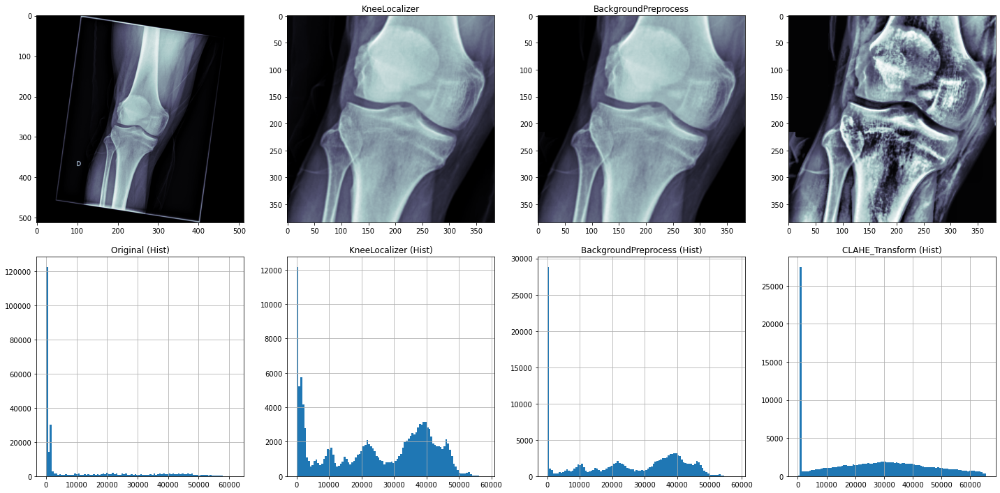

In [14]:
# Interesting images to review behaviour of KneeLocalizer
interesting_images = [
    "0HUO7A8SCS29Le9LC88F5O34ETUG41DA7BS13T0V92EQO35DT4C0U", 
    "0HTEVOH06MRG3e7BT8E46RP8AFKG41DO9NMAE90B43OHK6VM24H7E",
    "0J205DG2CKEI7e8OR7DNBT1S8P9G41D7N16LI50K8UVNSIKU9V1DO", # rotated
    "0JUA09CDMDLC7e5O1KIH14K0NODG41D0UC9FDL0I44VDTN378UOAB", # low optimal zone
    "0K1JTP5UI8DC9e6K3NR57PII5BOG41E0DH9OAQ0MFL2EUN50M5TEG",
    "0K7TGG4402G96e64T9F2NMR4N7JG41D759AH4I0UEMQSJT0S091TH",
    "0LF5UUS5AJERPeABG18NR1HE51AG41D2S217CK0QBAMJIKO8NUB9L",
    "0LF9O0IHENGPSeC523GG83PHT1SG41DCGRDANP0OFL2D1TKMCD53L",
    "1BGBLNBMTIS42eB6SKVE56HE9FPG41D9VECFA806AF8UDKK08FACE", # top black
    "1CRNSULB72DL4e0IT0DCH1LF81LG41DSCI29D70B4PLVEKFBLCQND",
    "1DM4H7AJQ2J4Oe57QB7GKMB0VU3G41D2UH3E4L0588S5B2TBCD2TE", # top white
    "1G55QJKO0AUQSeAUKEL6T8RV3BKG41D0U5F6N70P702LUGKIQF7DG",
    "1LOQGGCBJTJUMe8D86TLOAL9SMIG41DFCO91TG0A7H33HETJ53MHO",
    "1OT79P7151DPVeFCGT1SQN108AAG41DU5LLLQ709D32TB1LE3L85B",
    "1VMMELUGP80BNe1OJJ8HLEV8A24G41DOTTMP9R0FABSTPS8NSMKJB",
    "1VMS8J3DFPHA4e8HJSCTB0BF3I9G41D20NK4R40E1T4NMBNITDQ7K", # mask white
    "1VNFBFORMOGP8e3TT9KCGP98G0FG41DD6IP0OD071OI9CKOHI1P0B",
    "D8FFC68KBMG58e9Q3RJO32S4SMNG41DPKLA5E70GC9RMKR8FQGUJS",
    "DES5D8C48NA3Ne9V1BLLDFUJ7ACG41DUIGGIN20V1728M93RL3BE3",
    "DIK28QP4PNPJPe72DJ6AIOSD7KKG41D97L8LNL0B5SPD7O25063Q1",
    "DILIDGRG0RDJ4e08M14IG2EN6M1G41DDASPRQ40FEGS6I7VA9958B",
    "0DER333KBQVUVe8URSU2EG8MQ1MG41DQ5EPUMQ0KDD5DI5VBH4DE8", #dark and letter
    "0EHFIA4LO39F6e3B16N3QSBL1D7G41DPCSPJ5F068VAVS1BORAOMG", #letter I on square
    "20200604.142343.752.66877.PACS0885",                    #letter on top left on limit
    "A0DVCDRG9JNPBeB9DT25NHI40UDG41D071GGNQ048NC405E2KBOTV", #dark image
    "A0F4GPNQ595HVe0O7H0O21B18O6G41DMUC5M0R0AA3FGONVA845SR", # extra text
    "A0R8G80HI7OHUe6OECMU639BV74G41DHLQ8SCA0A8HF0HIJHO714A", # difficult to cut appropiatle and otherwise is too dark
    "A1QD0PCF18HFIeDHD5LTOTGDP2IG41DM7B131V063KIGBNRABE2QS", # bright image
    "5SEQ2VVB6TAVCe5L24FB0J91ES6G41DEMNRUCS0FERBT7BN93G7TT",
]

interesting_df = pd.DataFrame(interesting_images, columns=['Original_Filename'])
interesting_df['Raw_preprocess'] = interesting_df['Original_Filename'].apply(lambda filename: os.path.join(run_params['RAW_PREPROCESS_FOLDER'], filename + '.png'))
interesting_df['Target'] = interesting_df.index.astype('string')

DEBUG = True
if DEBUG:

    # for path in interesting_df['Raw_preprocess']:
    for path in [interesting_df['Raw_preprocess'][2]]:
    # for path in interesting_df['Raw_preprocess'][interesting_df['Original_Filename'] == "0K7TGG4402G96e64T9F2NMR4N7JG41D759AH4I0UEMQSJT0S091TH"]:
    # for path in ['sources/extra_images/failing.png']:
        # img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = PILPNGFloatBW.create(path)
        # img = PILImageBW.create(path)
        debug_info = []
        debug_info.append(
            {
                'img': img,
                'title': 'Original'
            }
        )
        for i, t in enumerate(item_tfms):
            # if i == 0:
            #     t.np_input = True
            # elif i == len(item_tfms) - 1:
            #     t.np_output = True
            
            img = t(img)

            # if i == 0:
            #     t.np_input = False
            # elif i == len(item_tfms) - 1:
            #     t.np_output = False
            
            debug_info.append(
                {
                    'img': img,
                    'title': t.name
                }
            )

        print()
        cols = min(4, len(item_tfms) + 1)
        rows = (len(debug_info) // cols + (len(debug_info) % cols != 0)) * 2
        fig, axs = plt.subplots(
            rows,
            cols, 
            figsize=(5 * cols, 5 * rows)
        )
        # fig.suptitle(Path(path).name)
        for row_i, row_axs in enumerate(axs):
            if not isinstance(row_axs, Iterable):
                row_axs = [row_axs]
            for i, ax in enumerate(row_axs):
                if i >= len(debug_info):
                    break
                info = debug_info[i]
                if row_i % 2 == 0:
                    if type(info['img']) != np.ndarray:
                        info_img = ToTensor()(info['img']).numpy()
                        
                        if len(info_img.shape) > 2:
                            info_img = np.squeeze(info_img, 0)
                        ax.imshow(info_img, cmap=plt.cm.bone)
                    else:
                        ax.imshow(info["img"], cmap=plt.cm.bone)
                        ax.set_title(info['title'])
                else:
                    pd.DataFrame(ToTensor()(info['img']).flatten()).hist(bins=100, ax=ax)
                    ax.set_title(info['title'] + ' (Hist)')
        fig.tight_layout()
        fig.show()

else:

    label_data = DataBlock(
        # blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
        blocks=(ImageBlock(cls=PILPNGFloatBW), CategoryBlock),
        get_x=ColReader('Original_Filename', pref=run_params['RAW_PREPROCESS_FOLDER']+'/', suff='.png'), 
        get_y=ColReader('Target'),
        splitter=RandomSplitter(valid_pct=0),
        item_tfms=item_tfms,
        # batch_tfms=batch_tfms,
    ).dataloaders(interesting_df, bs=len(interesting_df), num_workers=0)

    label_data.show_batch(cmap=plt.cm.bone, max_n=len(interesting_df))

In [ ]:
xs = np.arange(10000)
y = 1
y0 = 0

decay = 0.999

ys = []
for i, x in enumerate(xs):
    if i == 0:
        ys.append((1 - decay) * y)
    else:
        ys.append(decay * ys[-1] + (1 - decay) * y)

plt.plot(xs,ys)

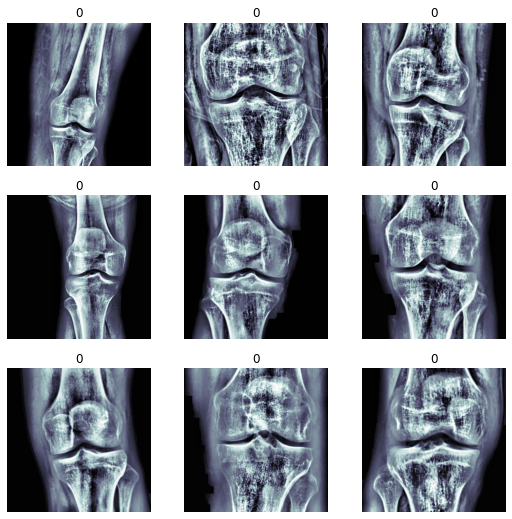

In [15]:
label_data = DataBlock(
    blocks=(ImageBlock(cls=PILPNGFloatBW), CategoryBlock),
    get_x=ColReader('Original_Filename', pref=run_params['RAW_PREPROCESS_FOLDER']+'/', suff='.png'), 
    get_y=ColReader('Target'),
    splitter=TestColSplitter(col='Dataset'),
    item_tfms=item_tfms,
    # batch_tfms=batch_tfms,
    batch_tfms=[IntToFloatTensor(div=2**16 - 1)]
).dataloaders(label_df, bs=run_params['BATCH_SIZE'], num_workers=0)

label_data.show_batch(cmap=plt.cm.bone)

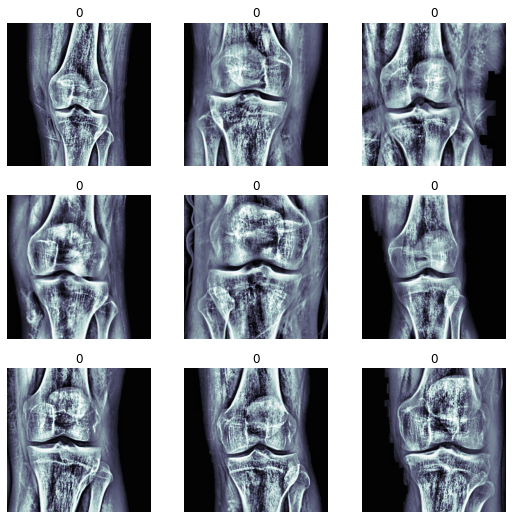

In [16]:
label_data.show_batch(cmap=plt.cm.bone)

array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

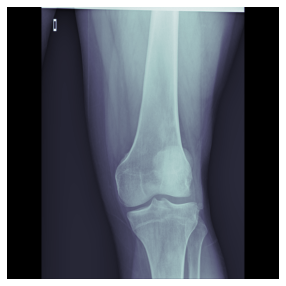

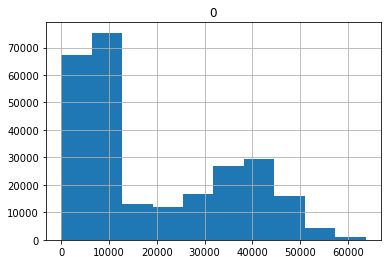

In [17]:
i = 0
img = label_data.do_item([i])[0][0]

img.show(cmap=plt.cm.bone)
pd.DataFrame(tensor(img).numpy().flatten()).hist()

In [18]:
label_data.after_batch

Pipeline: IntToFloatTensor -- {'div': 65535, 'div_mask': 1}

<AxesSubplot:>

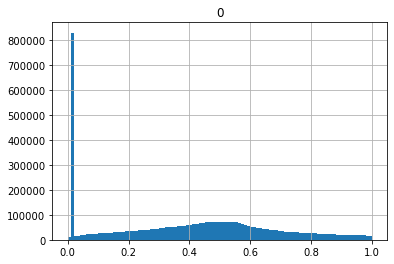

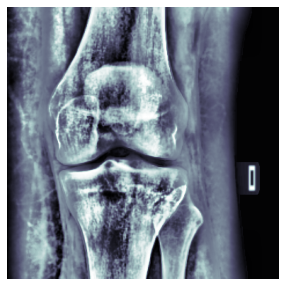

In [19]:
b = label_data.one_batch()[0]
pd.DataFrame(tensor(b.cpu()).numpy().flatten()).hist(bins=100)
PILImageBW.create(ToTensor()(b[0].cpu()).squeeze()).show(cmap=plt.cm.bone)

In [49]:
img = label_data.do_item([0])

In [50]:
tensor(img[0][0]).float().mean()

tensor(18827.6250)

In [51]:
label_data.after_batch

Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}

In [132]:
label_data.after_batch.fs

(#3) [IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}:
encodes: (TensorMask,object) -> encodes
(TensorImage,object) -> encodes
decodes: (TensorImage,object) -> decodes
,Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'reflection', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5}:
encodes: (TensorBBox,object) -> encodes
(TensorPoint,object) -> encodes
(TensorImage,object) -> encodes
(TensorMask,object) -> encodes
decodes: ,Brightness -- {'max_lighting': 0.2, 'p': 1.0, 'draw': None, 'batch': False}:
encodes: (TensorImage,object) -> encodes
decodes: ]

In [148]:
dls.dataset

(#402) [(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.])),(PILImageBW mode=L size=512x512, TensorMultiCategory([1., 0., 0.]))...]

In [151]:
bs = 4

In [153]:
def _apply_pipeline(p, x):
    for f in p.fs:
        name = f.name
        print(name)
        try:
            x = f(x)
        except Exception as e:
            print(f"    applying {name} failed.")
            raise e
    return x

def _find_fail_collate(s):
    s = L(*s)
    for i in range_of(s[0]):
        try: _ = default_collate(s.itemgot(i))
        except:
            shapes = [getattr(o[i], 'shape', None) for o in s]
            return f"Could not collate the {i}-th members of your tuples because got the following shapes\n{','.join([str(s) for s in shapes])}"


dls = label_data
print("\nBuilding one batch")
if len([f for f in dls.train.after_item.fs if f.name != 'noop'])!=0:
    print("Applying item_tfms to the first sample:")
    s = [_apply_pipeline(dls.train.after_item, dls.dataset[0])]
    print(f"\nAdding the next {bs-1} samples")
    s += [dls.train.after_item(dls.dataset[i]) for i in range(1, bs)]
else:
    print("No item_tfms to apply")
    s = [dls.train.after_item(dls.dataset[i]) for i in range(bs)]

if len([f for f in dls.train.before_batch.fs if f.name != 'noop'])!=0:
    print("\nApplying before_batch to the list of samples")
    s = _apply_pipeline(dls.train.before_batch, s)
else: print("\nNo before_batch transform to apply")

print("\nCollating items in a batch")
try:
    b = dls.train.create_batch(s)
    b = retain_types(b, s[0] if is_listy(s) else s)
except Exception as e:
    print("Error! It's not possible to collate your items in a batch")
    why = _find_fail_collate(s)
    print("Make sure all parts of your samples are tensors of the same size" if why is None else why)
    raise e

if len([f for f in dls.train.after_batch.fs if f.name != 'noop'])!=0:
    print("\nApplying batch_tfms to the batch built")
    b = to_device(b, dls.device)
    b = _apply_pipeline(dls.train.after_batch, b)
else: print("\nNo batch_tfms to apply")


Building one batch
Applying item_tfms to the first sample:
XRayPreprocess
KneeLocalizer
Resize -- {'size': (512, 512), 'method': 'pad', 'pad_mode': 'zeros', 'resamples': (2, 0), 'p': 1.0}
ToTensor

Adding the next 3 samples

No before_batch transform to apply

Collating items in a batch

Applying batch_tfms to the batch built
IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}
Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'reflection', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5}
Brightness -- {'max_lighting': 0.2, 'p': 1.0, 'draw': None, 'batch': False}


In [154]:
b

(TensorImageBW([[[[0.0135, 0.0080, 0.0084,  ..., 0.2391, 0.2339, 0.2319],
           [0.0139, 0.0097, 0.0112,  ..., 0.2350, 0.2308, 0.2277],
           [0.0187, 0.0150, 0.0158,  ..., 0.2321, 0.2306, 0.2275],
           ...,
           [0.2888, 0.2932, 0.3011,  ..., 0.1937, 0.1884, 0.1854],
           [0.2889, 0.2935, 0.3017,  ..., 0.1970, 0.1915, 0.1885],
           [0.2856, 0.2904, 0.2995,  ..., 0.1985, 0.1946, 0.1916]]],
 
 
         [[[0.0000, 0.0000, 0.0000,  ..., 0.1402, 0.1343, 0.1325],
           [0.0000, 0.0000, 0.0000,  ..., 0.1403, 0.1350, 0.1336],
           [0.0000, 0.0000, 0.0000,  ..., 0.1401, 0.1367, 0.1333],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0235, 0.0235, 0.0235],
           [0.0000, 0.0000, 0.0000,  ..., 0.0235, 0.0235, 0.0235],
           [0.0000, 0.0000, 0.0000,  ..., 0.0235, 0.0235, 0.0235]]],
 
 
         [[[0.1433, 0.1468, 0.1490,  ..., 0.0039, 0.0039, 0.0039],
           [0.1426, 0.1445, 0.1468,  ..., 0.0039, 0.0039, 0.0039],
           

array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

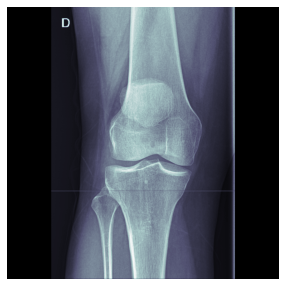

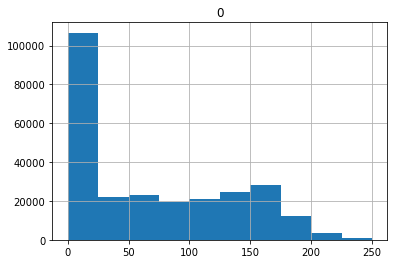

In [86]:
img_ = b[0][0]

img_.show(cmap=plt.cm.bone)
pd.DataFrame(tensor(img_).numpy().flatten()).hist()

In [153]:
count = 0

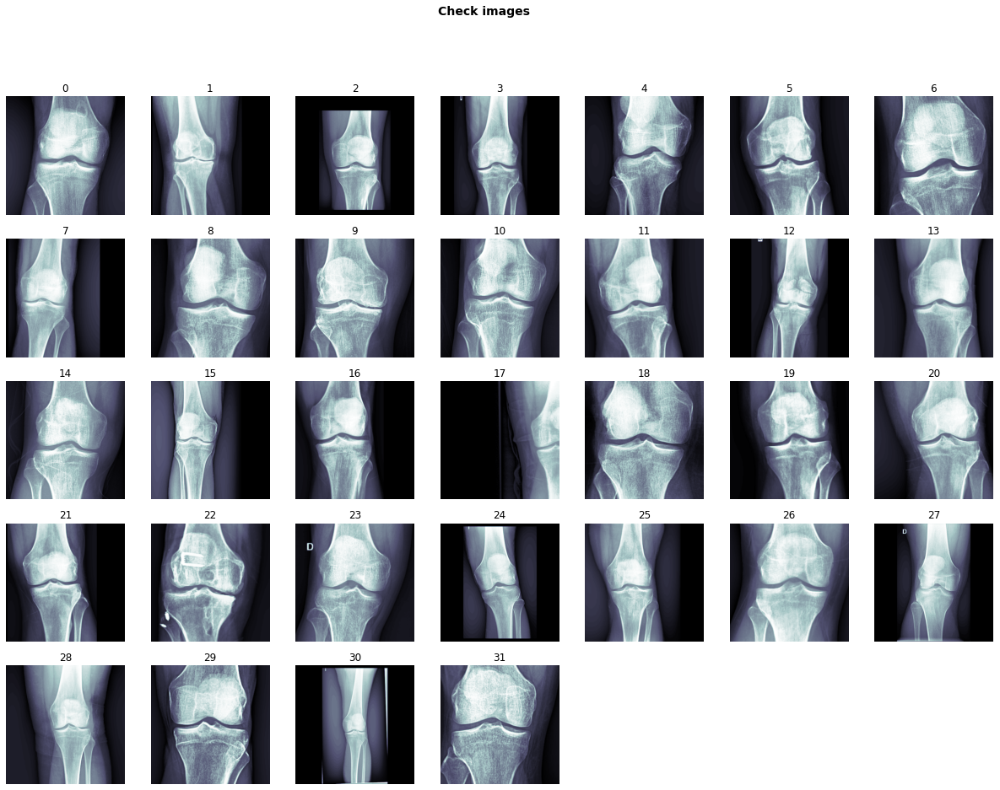

In [154]:
axs = get_grid(BATCH_SIZE, nrows=None, ncols=None, add_vert=1, figsize=None, title='Check images')
for i, ax in enumerate(axs):
    label_data.after_item(
        PILImageBW.create(train_df.Raw_preprocess.iloc[count + i])
    ).show(ctx=ax, cmap=plt.cm.bone)
    ax.set_title(f'{count + i}')

count += BATCH_SIZE

In [149]:
class KneeLocalizer(Transform):
    """ Based on code from https://github.com/MIPT-Oulu/KneeLocalizer
    
    ```
    @inproceedings{tiulpin2017novel,
        title={A novel method for automatic localization of joint area on knee plain radiographs},
        author={Tiulpin, Aleksei and Thevenot, Jerome and Rahtu, Esa and Saarakkala, Simo},
        booktitle={Scandinavian Conference on Image Analysis},
        pages={290--301},
        year={2017},
        organization={Springer}
    }
    ```
    """
    def __init__(self, svm_model_path, debug=False):
        super().__init__()
        self.win_size = (64, 64)
        self.win_stride = (64, 64)
        self.block_size = (16, 16)
        self.block_stride = (8, 8)
        self.cell_size = (8, 8)
        self.padding = (0, 0)
        self.nbins = 9
        self.scales = [1, 1.25, 1.5, 2]

        self.svm_w, self.svm_b = np.load(svm_model_path, encoding='bytes', allow_pickle=True)
        
        self.debug = debug

    def encodes(self, x:PILImage):
        img = ToTensor()(x).squeeze().numpy()
        R, C = img.shape

        # We will store the coordinates of the top left and
        # the bottom right corners of the bounding box
        hog = cv2.HOGDescriptor(self.win_size,
                                self.block_size,
                                self.block_stride,
                                self.cell_size,
                                self.nbins)

        displacements = range(-C // 4, 1 * C // 4 + 1, C // 8)
        prop = self.get_joint_y_proposals(img)
        best_score = -np.inf

        for y_coord in prop:
            for x_displ in displacements:
                for scale in self.scales:
                    if C / 2 + x_displ - R / scale / 2 >= 0 and y_coord - R / scale / 2 >= 0:
                        # Candidate ROI
                        roi = np.array([C / 2 + x_displ - R / scale / 2,
                                        y_coord - R / scale / 2,
                                        R / scale, R / scale], dtype=np.int)
                        x1, y1 = roi[0], roi[1]
                        x2, y2 = roi[0] + roi[2], roi[1] + roi[3]
                        patch = cv2.resize(img[y1:y2, x1:x2], self.win_size)

                        hog_descr = hog.compute(patch, self.win_stride, self.padding)
                        score = np.inner(self.svm_w, hog_descr.ravel()) + self.svm_b

                        if score > best_score:
                            best_score = score
                            roi_R = ((x1, y1), (x2,y2))

                        if self.debug:
                            print()
                            plt.imshow(patch, cmap=plt.cm.bone)
                            plt.title(f'{score:.2f}{(x1, y1), (x2,y2)}')
                            plt.show()

        return x.__class__.create(img[roi_R[0][1]:roi_R[1][1], roi_R[0][0]:roi_R[1][0]])


    def get_joint_y_proposals(self, img, av_points=2, av_derv_points=11, margin=0.25, step=10):
        """Return Y-coordinates of the joint approximate locations."""

        R, C = img.shape

        # Sum the middle if the leg is along the X-axis
        segm_line = np.sum(img[int(R * margin):int(R * (1 - margin)),
                            int(C / 3):int(C - C / 3)], axis=1)
    
        # Smooth the segmentation line and find the absolute of the derivative smoothed
        smooth_segm_line = np.abs(
            np.convolve(
                np.diff(
                    np.convolve(
                        segm_line,
                        np.ones((av_points, )) / av_points
                    )[(av_points - 1):-(av_points - 1)]
                ),
                np.ones((av_derv_points, )) / av_derv_points
            )[(av_derv_points - 1):-(av_derv_points - 1)]
        )

        # Get top tau % of the peaks
        peaks = np.argsort(smooth_segm_line)[::-1][:int(0.1 * R * (1 - 2 * margin))]
        
        return peaks[::step] + int(R * margin)

In [147]:
check_idx = 44
knee_localizer = KneeLocalizer(KNEE_SVM_MODEL_PATH, debug=True)

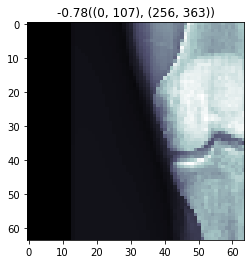

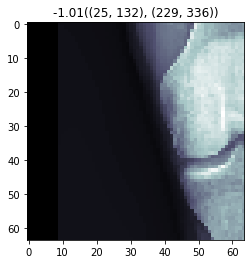

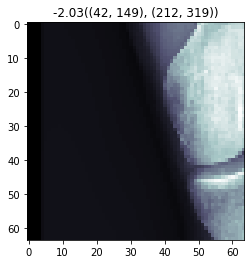

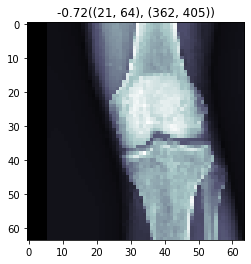

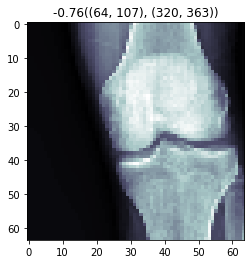

...

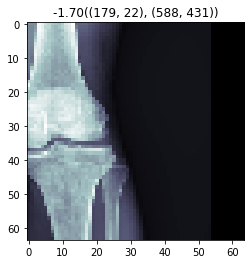

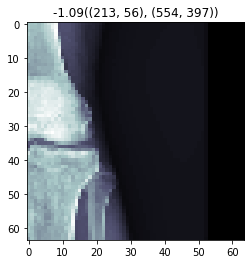

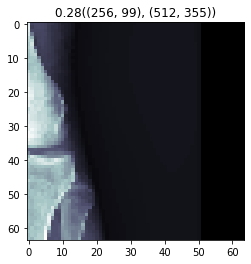

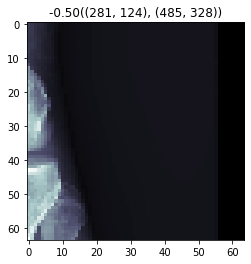

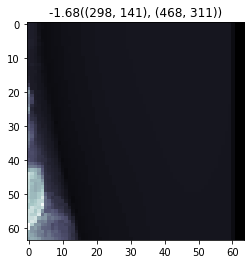

<AxesSubplot:>

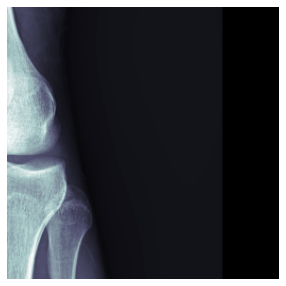

In [148]:
knee_localizer(
    PILImageBW.create(train_df.Raw_preprocess.iloc[check_idx])
).show(cmap=plt.cm.bone)

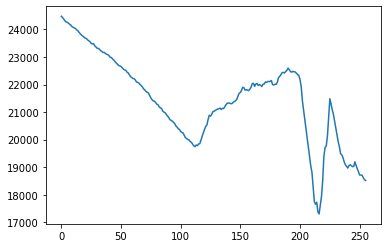

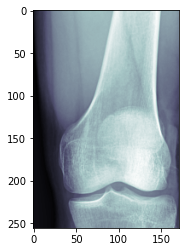

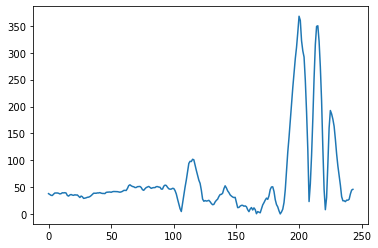

[200 201 215 214 199 202 216 213 198 203 204 197 217 196 212 205 195 218
 194 225 206 226 211 227 193]


array([328, 332, 334], dtype=int64)

In [133]:
knee_localizer.get_joint_y_proposals(
    ToTensor()(
        PILImageBW.create(train_df.Raw_preprocess.iloc[check_idx])
    ).squeeze().numpy()
)

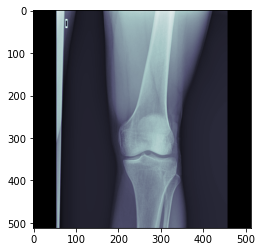

In [99]:
img = PILImageBW.create(train_df.Raw_preprocess.iloc[check_idx])
img = ToTensor()(img).squeeze().numpy()
plt.imshow(img, cmap=plt.cm.bone)

In [125]:
R, C = img.shape
av_points = 2
av_derv_points = 11
margin = 0.25

# Sum the middle if the leg is along the X-axis
segm_line = np.sum(img[int(R * margin):int(R * (1 - margin)),
                    int(C / 3):int(C - C / 3)], axis=1)

# Smooth the segmentation line and find the absolute of the derivative
smooth_segm_line = np.abs(
    np.convolve(
        np.diff(
            np.convolve(
                segm_line,
                np.ones((av_points, )) / av_points
            )[(av_points - 1):-(av_points - 1)]
        ),
        np.ones((av_derv_points, )) / av_derv_points
    )[(av_derv_points - 1):-(av_derv_points - 1)]
)

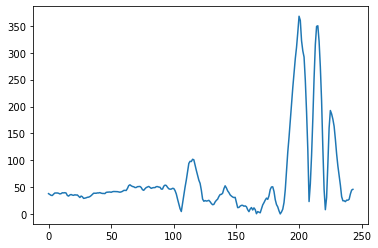

In [126]:
plt.plot(smooth_segm_line)

In [42]:
meta = pd.read_csv('data\metadata_raw_local.csv')

In [188]:
train_df[train_df.Target == '3'].Raw_preprocess.iloc[0]

'data/raw_preprocess\\17SLVLNLJJ27Re3UBUHEEJAVMOIG41D5CJJ60L0T0O35K14TNLLKM.png'

In [204]:
row = meta[(meta.PixelSpacing == 0.5625) & (meta.PixelSpacing.notnull())].iloc[3]
spacing = row.PixelSpacing
filepath = row.fname
filename = os.path.split(filepath)[-1]
preprocess_filepath = os.path.join(RAW_PREPROCESS_FOLDER, filename + '.png')
preprocess_filepath = label_df[label_df.Target == '3'].Raw_preprocess.iloc[0]
img = PILImageBW.create(preprocess_filepath)
img = ToTensor()(img).squeeze().numpy()

In [197]:
knee_localizer = KneeLocalizer()

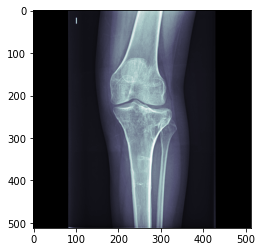

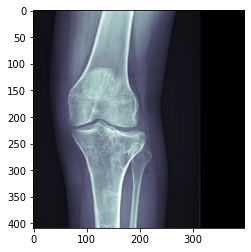

In [205]:
plt.imshow(img, cmap=plt.cm.bone)
plt.show()

plt.imshow(knee_localizer(img), cmap=plt.cm.bone)
plt.show()

In [73]:
color = (255, 0, 0)
image = cv2.rectangle(img, tuple(roi_R[:2]), tuple(roi_R[2:]), color, 10) 
  
# Displaying the image  
cv2.imshow('Image', image)  

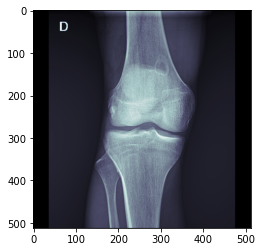

In [74]:
import matplotlib.pyplot as plt
plt.imshow(image, cmap=plt.cm.bone)

In [148]:
df

,Unnamed: 0,Unnamed: 1,SpecificCharacterSet,ImageType,SOPClassUID,SOPInstanceUID,StudyDate,SeriesDate,AcquisitionDate,ContentDate,AcquisitionDateTime,StudyTime,SeriesTime,AcquisitionTime,ContentTime,AccessionNumber,Modality,PresentationIntentType,Manufacturer,InstitutionName,ReferringPhysicianName,StationName,StudyDescription,SeriesDescription,OperatorsName,...,RequestedProcedureCodeSequence,CommentsOnThePerformedProcedureStep,FillerOrderNumberImagingServiceRequest,MultiReferencedImageSequence,ReferencedImageSequence1,ReferencedImageSequence2,MultiSequenceVariant,SequenceVariant1,MultiImagePositionPatient,ImagePositionPatient1,ImagePositionPatient2,MultiImageOrientationPatient,ImageOrientationPatient1,ImageOrientationPatient2,ImageOrientationPatient3,ImageOrientationPatient4,ImageOrientationPatient5,MultiRequestedProcedureCodeSequence,SpacingBetweenSlices,SequenceVariant2,MultiScanOptions,ScanOptions1,ReferencedPatientSequence,ExposedArea,MultiReferencedPatientSequence


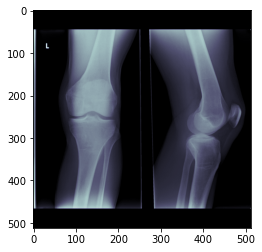

In [154]:
df = meta[(meta.PixelSpacing == 0.2) & (meta.PixelSpacing.notnull())]
for i in range(len(df)):
    row = df.iloc[i]
    spacing = row.PixelSpacing
    filepath = row.fname
    filename = os.path.split(filepath)[-1]
    preprocess_filepath = os.path.join(RAW_PREPROCESS_FOLDER, filename + '.png')
    img = PILImageBW.create(preprocess_filepath)
    img = ToTensor()(img).squeeze().numpy()

    print()
    plt.imshow(img, cmap=plt.cm.bone)
    plt.show()

    break

In [153]:
row

't2_fi3d_sag_p2_iso'